> https://www.kaggle.com/ratthachat/aptos-eye-preprocessing-in-diabetic-retinopathy/notebook

In [1]:
import numpy as np
import pandas as pd
import os 
print(os.listdir("../input"))


['aptos2019-blindness-detection', 'retinopathy-train-2015', 'diabetic-retinopathy-224x224-gaussian-filtered', 'diabetic-retinopathy-resized']


In [2]:
import os,sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
import warnings 
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77

TRAIN_NUM = 1000


loading the train/test dataframes

In [3]:
df_train = pd.read_csv('../input/aptos2019-blindness-detection/train.csv')
df_test = pd.read_csv('../input/aptos2019-blindness-detection/test.csv')

x = df_train['id_code']
y = df_train['diagnosis']

x, y = shuffle(x, y, random_state = SEED)


split the datafram to train dataset and valid dataset,  visialize the y

(3112,) (3112,) (550,) (550,)


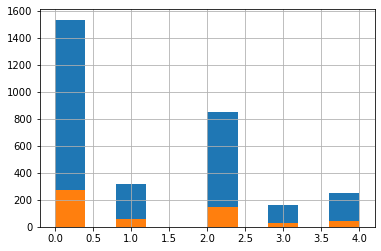

In [4]:
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size = 0.15,stratify = y, random_state = SEED)
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()


have a glance of original inputs,

CPU times: user 4.58 s, sys: 268 ms, total: 4.84 s
Wall time: 4.64 s


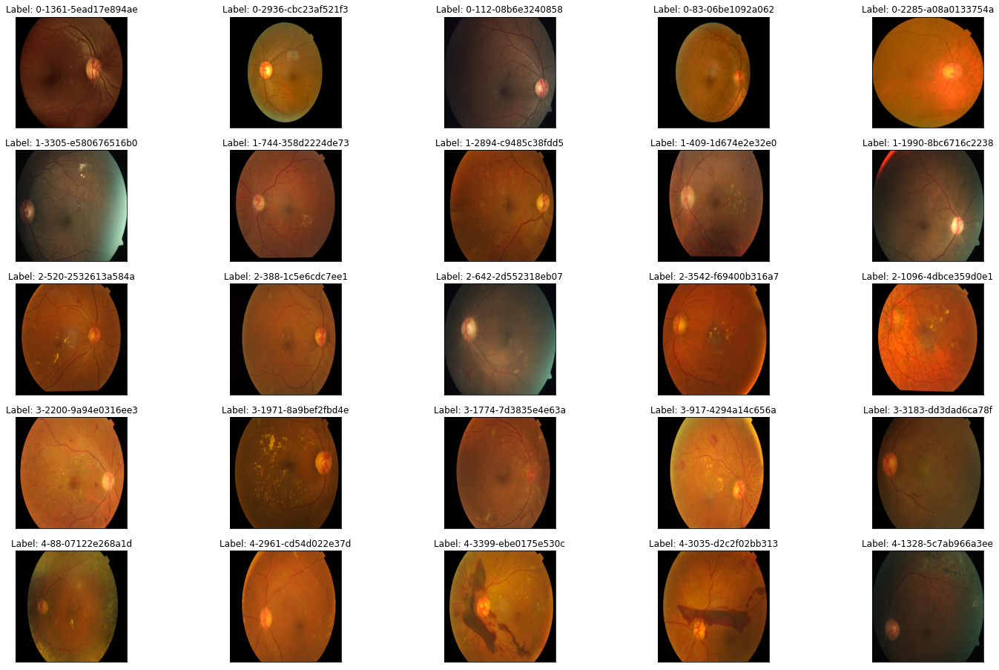

In [5]:
%%time
fig = plt.figure(figsize = (25, 16))

for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        
        plt.imshow(image)
        
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']))
        
        

CPU times: user 4.34 s, sys: 185 ms, total: 4.52 s
Wall time: 4.23 s


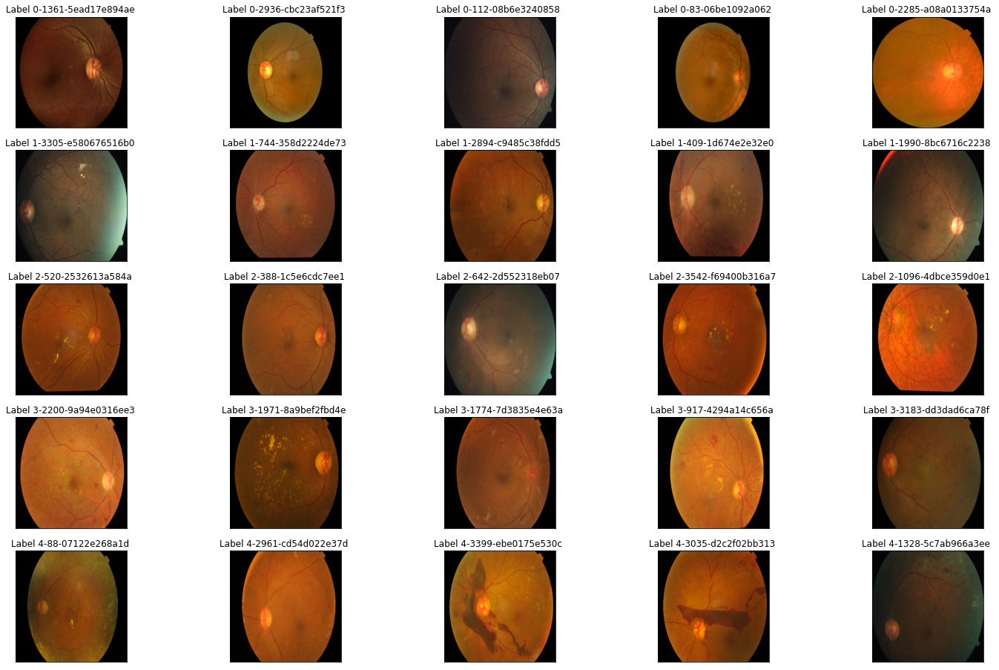

In [6]:
%%time

fig = plt.figure(figsize = (25, 16))

for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        plt.imshow(image)
        ax.set_title("Label %d-%d-%s " % (class_id, idx, row['id_code']))
    

try gray scale and feel understand better fo some pictures, as color distriaction is gone. For example, we can see more blood clearer in the upper part of pic

CPU times: user 4.23 s, sys: 107 ms, total: 4.34 s
Wall time: 4.1 s


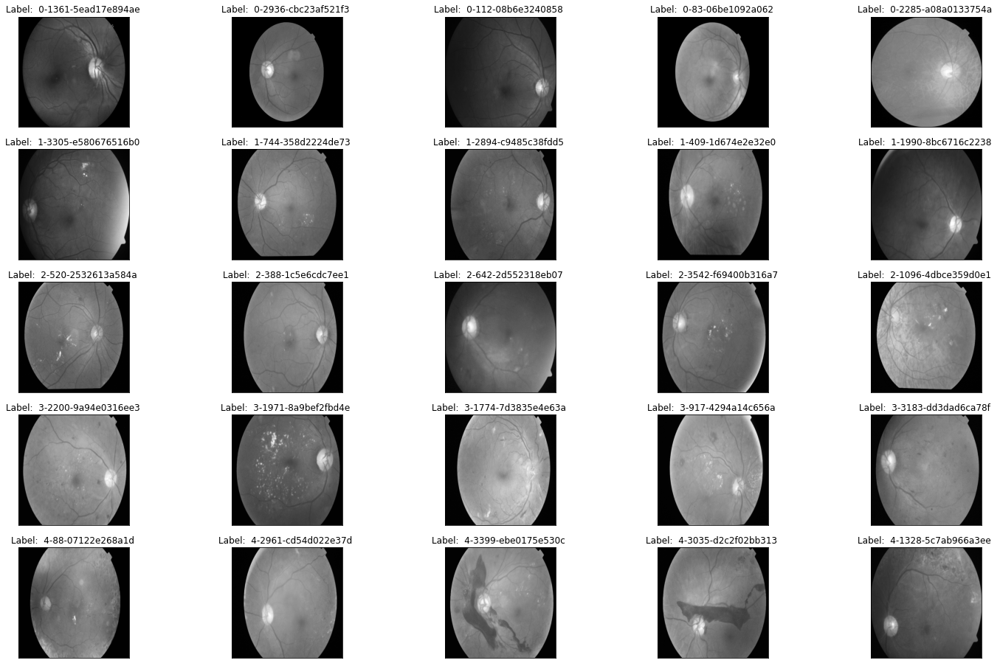

In [7]:
%%time

fig = plt.figure(figsize = (25, 16))

for class_id in (train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE,IMG_SIZE))
        
        plt.imshow(image, cmap = 'gray')
        ax.set_title("Label:  %d-%d-%s "%(class_id, idx, row['id_code']))

try zooming to see the details (use real size image), we can see some abnormalities

2136 3216


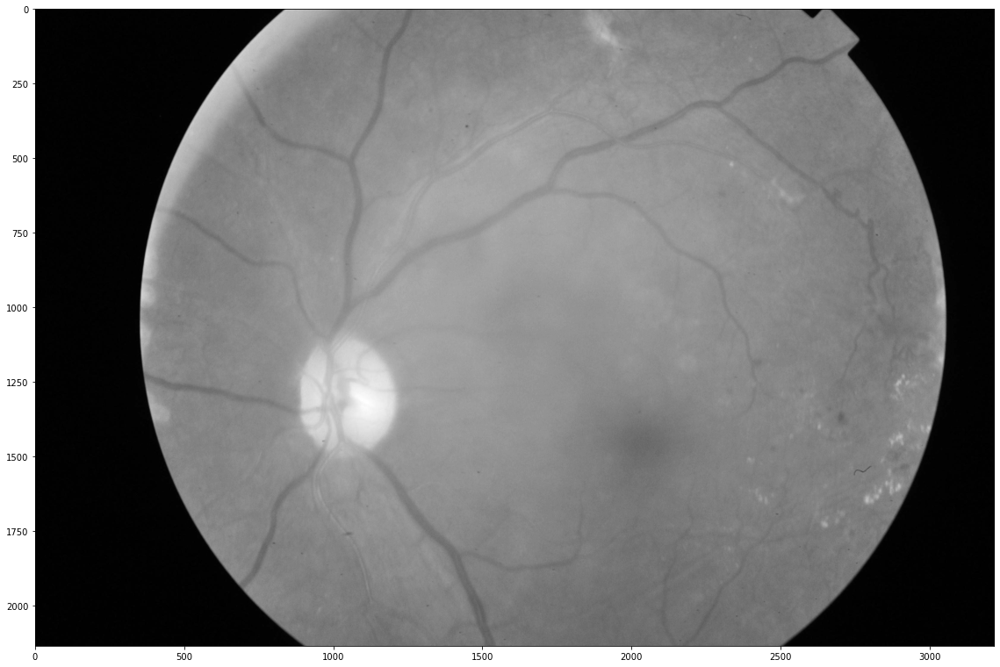

In [8]:
dpi = 80
path = f"../input/aptos2019-blindness-detection/train_images/cd54d022e37d.png" 
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE = 2
figsize = (width / float(dpi)) / SCALE, (height / float(dpi)) / SCALE

fig = plt.figure(figsize = figsize)
plt.imshow(image, cmap = 'gray')


Ben Graham's preprocessing  [Ben Graham](https://github.com/btgraham/SparseConvNet/tree/kaggle_Diabetic_Retinopathy_competition)

CPU times: user 38.2 s, sys: 197 ms, total: 38.4 s
Wall time: 13.8 s


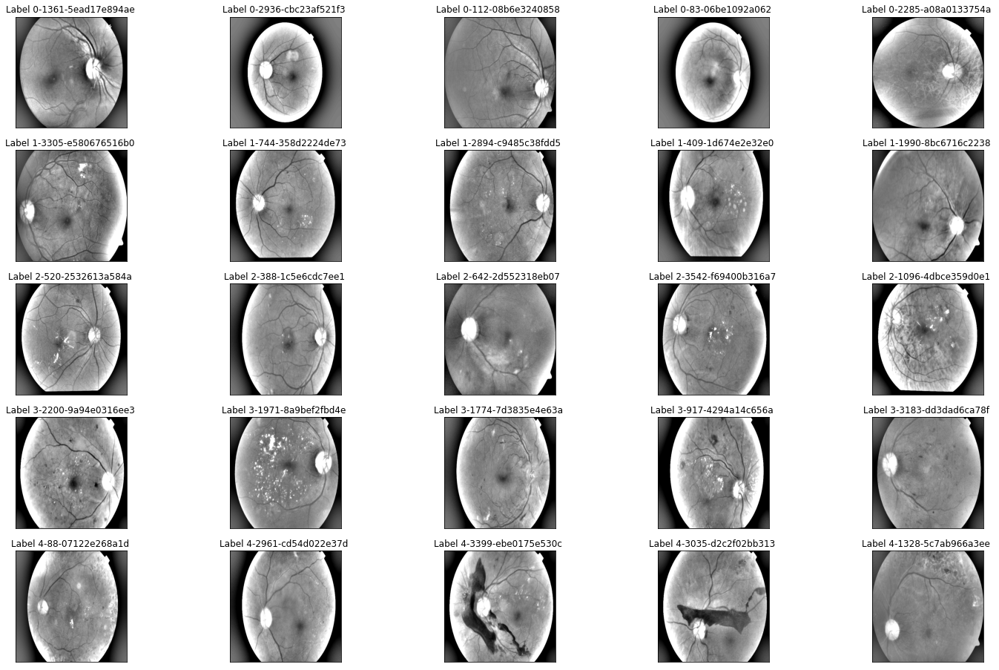

In [9]:
%%time
fig = plt.figure(figsize = (25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), IMG_SIZE / 10), -4, 128)
        
        plt.imshow(image, cmap = 'gray')
        ax.set_title("Label %d-%d-%s "%(class_id, idx, row['id_code']))
    

Try auto croping to crop out the uniformative black aeras which are evident on pic(0,1),pic(0,3),pic(4,1)

In [10]:

def crop_image1(img, tol = 7):
    mask = img > tol
    return img[np.ix_(mask.any(1), mask.any(0))]

# def crop_image_from_gray(img, tol = 7):
#     if img.ndim == 2:
#         mask = img > tol
#         return img[np.ix_(mask.any(1), mask.any(0))]
#     elif img.ndim == 3:
#         gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#         mask = gray_img > tol
        
#         check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
#         #image is too dark so that we crop out everything
#         if check_shape == 0:
#             return img
#         else:
#             img1 = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))]
#             img2 = img[:, :, 1][np.ix_(mask.any(1), mask.any(0))]
#             img3 = img[:, :, 2][np.ix_(mask.any(1), mask.any(0))]
            
#             img = np.stack([img1, img2, img3], axis = -1)
        
#         return img
    

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

Old version of image color cropping, use crop_image_from_grad instand
the above code work only for 1-channel. Here is extension for 3-channels image


In [11]:
def crop_iamge(img, tol = 7):
    if img.ndim == 2:
        mask = img > tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim == 3:
        h, w, _ = img.shape
        img1 = cv2.resize(crop_image1(img[:, :, 0]), (w, h))
        img2 = cv2.resize(crop_image1(img[:, :, 1]), (w, h))
        img3 = cv2.resize(crop_image1(img[:, :, 2]), (w, h))
        
        img[:, :, 0] = img1
        img[:, :, 1] = img2
        img[:, :, 2] = img3
        return img


# all of these do not work

def  crop_image2(image, thrshold = 5):
    if len(image.shape) == 3:
        flatImage = np.max(image, 2)
    else :
        flatImage = image
    assert len(flatImage.shape)  == 2
    
    rows = np.where(np.max(flatImage, 0) > threshold)[0]
    if rows.size:
        cols = np.where(np.max(flatImage, 1) > threshold)[0]
        image = image[cols[0] : cols[-1] + 1, rows[0] : rows[-1] + 1]
    else:
        image = image[:1, :1]
    return image

def crop_image3(image):
    mask = image > 0
    
    #coordiates of non-black pixels
    coords = np.argwhere(mask)
    
    #bounding box of non-black pixels
    x0, y0 = coords.min(axis = 0)
    x1, y1 = coords.man(axis = 0) + 1   #slices are exculsive at the top
    
    #get the contents of bounding box
    crooped = image[x0: x1, x1 : x2]
    return crooped

def crop_image4(image):
    _, thersh = cv2.threshold(image, 1, 255, cv2.THRESH_BINARY)
    countors, hierarchy = cv2.findCountous(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y : y + h, x : x + w]
    return crop
    
    


Make a color crop, color version is better,

In [12]:
# def load_ben_color(path, sigmaX = 10):
#     image = cv2.imread(path)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     image = crop_image_from_gray(image)
#     image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
#     image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)
    
#     return image
                            
    
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
    return image

CPU times: user 8.97 s, sys: 258 ms, total: 9.23 s
Wall time: 7.69 s


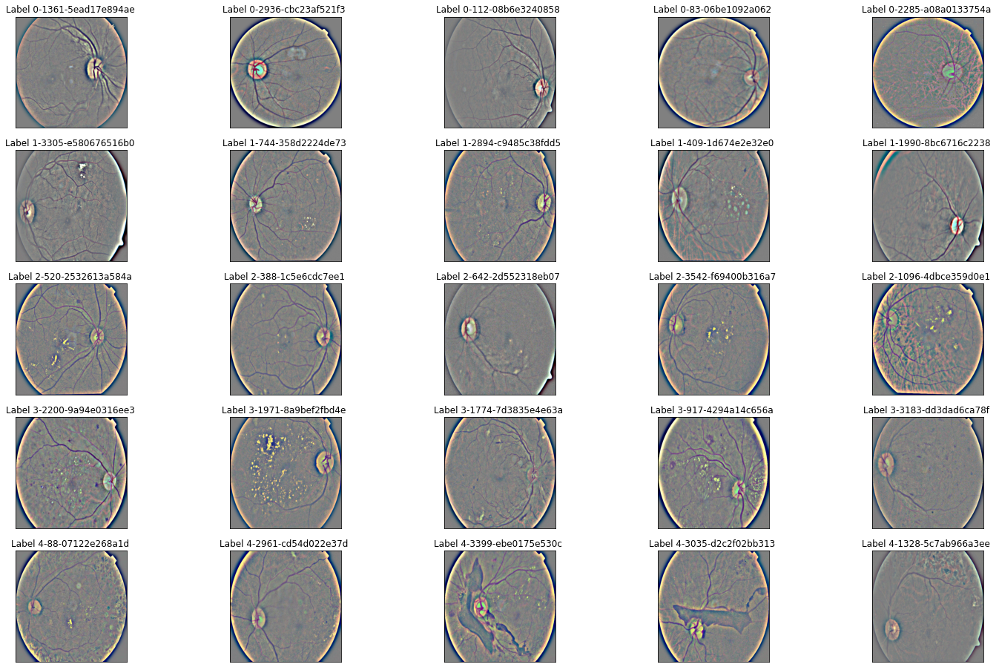

In [13]:
%%time

NUM_SAMP = 7
fig = plt.figure(figsize = (25, 16))

for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        
        image = load_ben_color(path)
        
        plt.imshow(image)
        ax.set_title("Label %d-%d-%s "%(class_id, idx, row['id_code']))

Making a circle crop to the image

In [14]:
# def circle_crop(path, sigmaX = 10):
#     image = cv2.imread(path) 
#     image = crop_image_from_gray(image)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
#     height, width, depth = image.shape
    
#     x = int(width / 2)
#     y = int(height / 2)
#     r = np.amin((x, y))
    
#     circle_image = np.zeros((height, width), np.uint8)
#     cv2.circle(circle_image, (x, y), int(r), 1, thickness = -1)
#     image = cv2.bitwise_and(image, image, mask = circle_image)
#     image = crop_image_from_gray(image)
#     image = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0, 0), sigmaX), -4, 128)
#     return image
    
def circle_crop(img, sigmaX=10):   
    """
    Create circular crop around image centre    
    """    
    
    img = cv2.imread(img)
    img = crop_image_from_gray(img)    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width, depth = img.shape    
    
    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))
    
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    return img 

CPU times: user 1min 23s, sys: 650 ms, total: 1min 24s
Wall time: 33.1 s


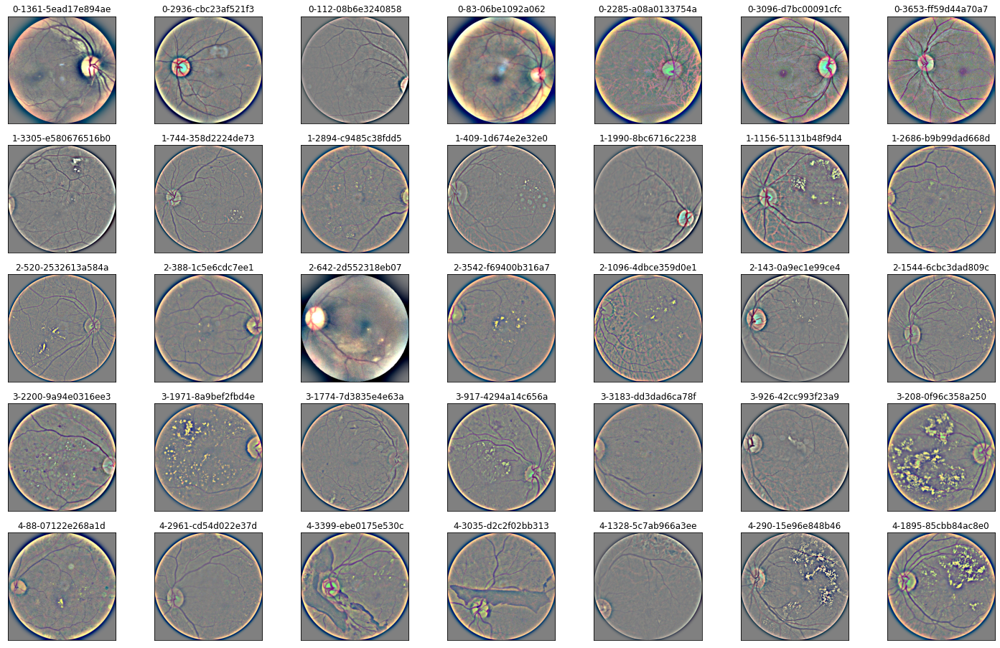

In [15]:


%%time
## try circle crop
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = circle_crop(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )
        
        
# %%time

# NUM_SAMP = 7
# fig = plt.figure(figsize = (25, 16))
# for class_id in sorted(train_y.unique()):
#     for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state = SEED).iterrows()):
#         ax = fig.add_subplot(5,NUM_SAMP,class_id * 5 + i + 1, xticks = [], yticks = [])
#         path = f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
#         image = circle_crop(path, sigmaX = 30)
        
#         plt.imshow(image)
#         ax.set_title("Label: %d-%d-%s " % (class_id, idx, row['id_code']))



512 512


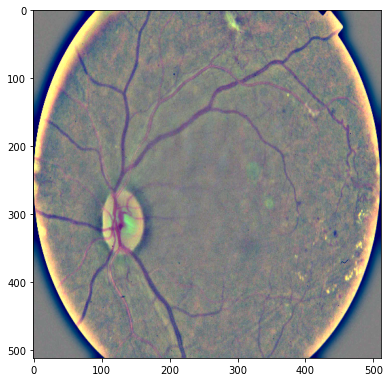

In [16]:
dpi = 80

path = f"../input/aptos2019-blindness-detection/train_images/cd54d022e37d.png"

image = load_ben_color(path, sigmaX = 10)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE = 1
figsize = (width / float(dpi)) / SCALE, (height / float(dpi)) / SCALE
fig = plt.figure(figsize = figsize)
plt.imshow(image, cmap = 'gray')

CPU times: user 34.3 s, sys: 474 ms, total: 34.8 s
Wall time: 13.7 s


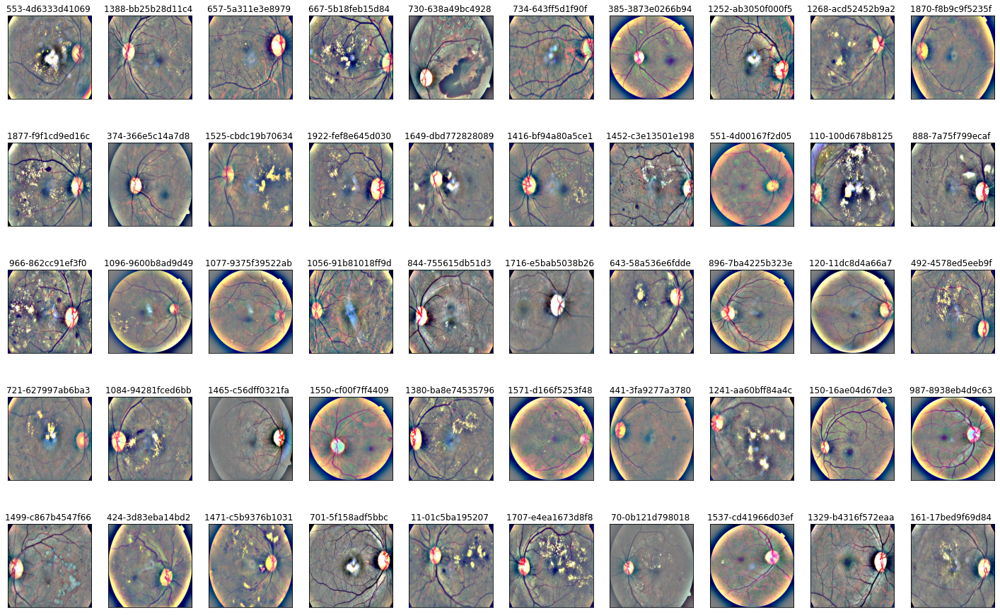

In [17]:
%%time 
NUM_SAMP = 10
fig = plt.figure(figsize = (25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP, random_state = SEED + jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks = [], yticks = [])
        path=f"../input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = load_ben_color(path, sigmaX = 30)
        
        plt.imshow(image)
        ax.set_title("%d-%s "%(idx, row['id_code']))

CPU times: user 1min 42s, sys: 448 ms, total: 1min 43s
Wall time: 32.3 s


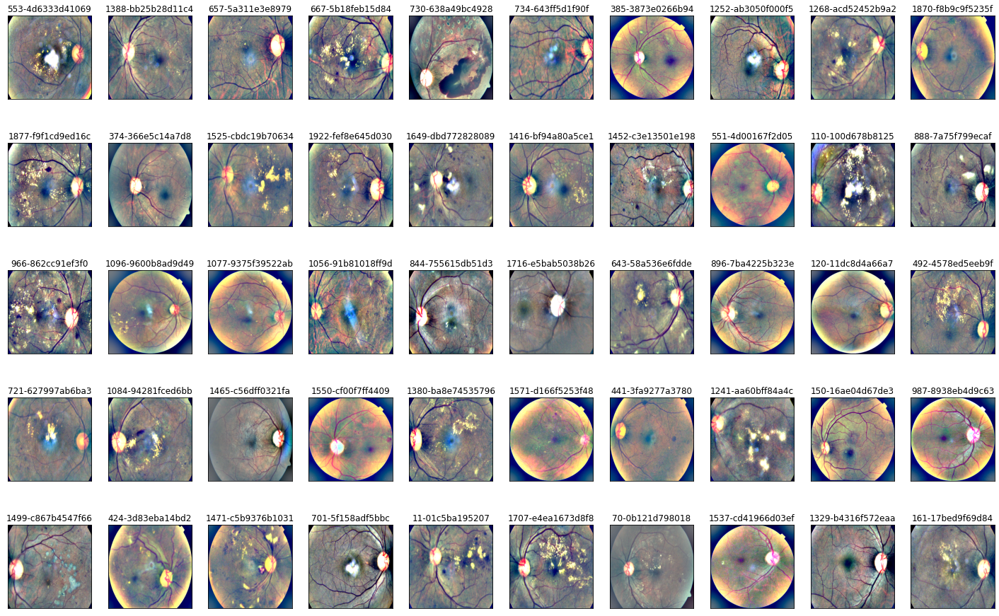

In [18]:
%%time 
NUM_SAMP = 10
fig = plt.figure(figsize = (25, 16))
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP, random_state = SEED + jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks = [], yticks = [])
        path = f"../input/aptos2019-blindness-detection/test_images/{row['id_code']}.png"
        image = load_ben_color(path, sigmaX = 50)
        
        plt.imshow(image, cmap = 'gray')
        ax.set_title("%d-%s" %(idx, row['id_code']))

In [19]:
!ls ../input/diabetic-retinopathy-resized/

resized_train  resized_train_cropped  trainLabels.csv  trainLabels_cropped.csv


In [20]:
!ls ../input/diabetic-retinopathy-resized/resized_train/resized_train | head

10003_left.jpeg
10003_right.jpeg
10007_left.jpeg
10007_right.jpeg
10009_left.jpeg
10009_right.jpeg
1000_left.jpeg
1000_right.jpeg
10010_left.jpeg
10010_right.jpeg
ls: write error: Broken pipe


In [22]:
df_old = pd.read_csv("../input/diabetic-retinopathy-resized/trainLabels.csv")
df_old.head()

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


AttributeError: 'numpy.int64' object has no attribute 'idx'

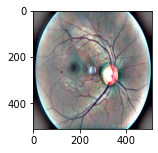

In [35]:
NUM_SAMP = 10
fig = plt.figure(figsize = (25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_old.loc[df_old['level'] == class_id].sample(NUM_SAMP, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1)
        path = f"../input/diabetic-retinopathy-resized/resized_train/resized_train/{row['image']}.jpeg"
        image = load_ben_color(path, sigmaX = 30)
        
        plt.imshow(image)
        ax.set_title("%d-%d-%s " %(class_id, idx,row['image']))

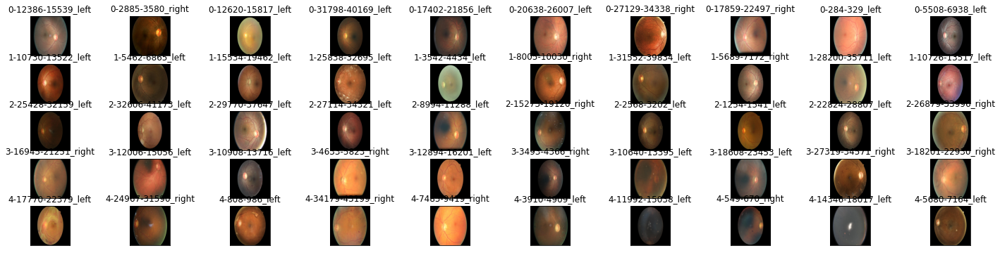

In [34]:
NUM_SAMP = 10
fig = plt.figure(figsize = (25, 6))
for class_id in sorted(train_y.unique()):
    for i,(idx, row) in enumerate(df_old.loc[df_old['level'] == class_id].sample(NUM_SAMP, random_state = SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks = [], yticks = [])
        path = f"../input/diabetic-retinopathy-resized/resized_train/resized_train/{row['image']}.jpeg"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        
        plt.imshow(image, cmap = 'gray')
        ax.set_title("%d-%d-%s"%(class_id, idx, row['image']))

512 512


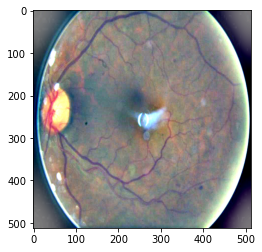

In [30]:
dpi = 80
path=f"../input/diabetic-retinopathy-resized/resized_train/resized_train/31590_right.jpeg"
image = load_ben_color(path, sigmaX = 30)

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE = 1
figsize = (width / float(dpi)) / SCALE, (height / float(dpi)) / SCALE
plt.imshow(image, cmap = 'gray')

In [31]:
!ls ../input/retinopathy-train-2015/rescaled_train_896/rescaled_train_896/ | head

10003_left.png
10003_right.png
10007_left.png
10007_right.png
10009_left.png
10009_right.png
1000_left.png
1000_right.png
10010_left.png
10010_right.png
ls: write error: Broken pipe


In [32]:
dpi = 80
path_jpg=f"../input/diabetic-retinopathy-resized/resized_train/resized_train/18017_left.jpeg" # too many vessels?
path_png=f"../input/retinopathy-train-2015/rescaled_train_896/rescaled_train_896/18017_left.png" # details are lost
image = cv2.imread(path_png)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = crop_image(image)
image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

image2 = cv2.imread(path_png)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2 = crop_image(image2)
image2= cv2.resize(image2, (IMG_SIZE, IMG_SIZE))

height, width = IMG_SIZE, IMG_SIZE
print(height, width)

SCALE = 1 / 4
figsize = (width / float(dpi)) / SCALE, (height / float(dpi)) / SCALE

fig = plt.figure(figsize = figsize)
ax = fig.add_subplot(2, 2, 1, xticks = [], yticks = [])
ax.set_title('png format original')
plt.imshow(image, cmap = 'gray')
ax = fig.add_subplot(2, 2, 2, xticks = [], yticks = [])
ax.set_title('jpg format original')
plt.imshow(image2, cmap = 'gray')

image = load_be_color(path_png, sigmaX = 30)
image2 = load_ben_color(path_jpg, sigmaX = 30)
ax = fig.add_subplot(2, 2, 3, xticks = [], yticks = [])
ax.set_title('png format transformed')
plt.imshow(image, cmap = 'gray')
ax = fig.add_subplot(2, 2, 4, xticks = [], yticks = [])
ax.set_title('jpg format transformed')
plt.imshow(image2, cmap = 'gray')


NameError: name 'crop_image' is not defined